In [1]:
from __future__ import print_function, division
import os
import torch
import pandas as pd
from skimage import io, transform
import numpy as np
import matplotlib.pyplot as plt

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

plt.ion()   # interactive mode

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import sys
sys.path.insert(0, '../')

In [4]:
os.environ['CUDA_VISIBLE_DEVICES'] = '1'

# Training with data augmentation

In [5]:
from torch import nn
from torch.nn import init
import torch.nn.functional as F

In [6]:
class CNNNet(nn.Module):

    def __init__(self, input_shape, output_shape):
        super(CNNNet, self).__init__()
        
        self.output_shape = output_shape
        self.input_shape = input_shape

        C, W, H = input_shape
        P, D = output_shape

        self.features = nn.Sequential(
            nn.Conv2d(C, 32, (3, 3), padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
            nn.Conv2d(32, 64, (3, 3), padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
            nn.Conv2d(64, 128, (3, 3), padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
            nn.Conv2d(128, 256, (3, 3), padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
        )

        self.classifier = nn.Sequential(
            nn.Linear(int(W/16*H/16*256), 256),
            nn.ReLU(inplace=True),
            nn.Linear(256, P*D)
        )
        
        self._weights_init()
        
    def _weights_init(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.xavier_normal(m.weight.data)

    def forward(self, x):    
        C, W, H = self.input_shape
        P, D = self.output_shape
        
        x = self.features(x)
        
        x = x.view(-1, int(W/16*H/16*256))
        
        x = self.classifier(x)
        
        return x.view(-1, P, D)


## Loading the dataset and splitting between train and valid

In [7]:
from cpe775.dataset import CroppedFaceLandmarksDataset, FaceLandmarksDataset
from torch.utils.data.sampler import SubsetRandomSampler
from torchvision.transforms import Compose
from cpe775.transforms import ToTensor, CropFace, ToGray, RandomHorizontalFlip, ToPILImage, RandomCrop, CenterCrop

In [8]:
batch_size = 32
random_seed = 42
valid_size = 0.2
shuffle = True

In [9]:
train_transforms = Compose([
                   ToPILImage(),
                   RandomCrop((224,224)),
                   RandomHorizontalFlip(),
                   ToGray(),
                   ToTensor()
                 ])

transforms = Compose([
                   ToPILImage(),
                   CenterCrop((224,224)),
                   ToGray(),
                   ToTensor()
                 ])

In [10]:
# load the dataset
train_dataset = CroppedFaceLandmarksDataset(data_file='../data/train.npz',
                                            transform=train_transforms)
valid_dataset = CroppedFaceLandmarksDataset(data_file='../data/train.npz',
                                            transform=transforms)

num_train = len(train_dataset)
indices = list(range(num_train))
split = int(np.floor(valid_size * num_train))

if shuffle == True:
    np.random.seed(random_seed)
    np.random.shuffle(indices)

train_idx, valid_idx = indices[split:], indices[:split]

train_sampler = SubsetRandomSampler(train_idx)
valid_sampler = SubsetRandomSampler(valid_idx)

train_loader = torch.utils.data.DataLoader(train_dataset, 
                batch_size=batch_size, sampler=train_sampler, num_workers=4)

valid_loader = torch.utils.data.DataLoader(valid_dataset, 
                batch_size=batch_size, sampler=valid_sampler, num_workers=4)

## Creating the model

In [11]:
net = CNNNet((1, 224, 224), (68, 2)) # input shape, output shape

In [12]:
net = torch.nn.DataParallel(net)
net = net.cuda()

In [13]:
np.sum([v.numel() for v in net.parameters()])

13268104

## Creating the loss function

In [14]:
import torch
from cpe775.criterion import NRMSELoss
from cpe775.model import Model
from cpe775 import callbacks

In [15]:
criterion = NRMSELoss()
criterion = criterion.cuda()

In [16]:
optimizer = torch.optim.SGD(net.parameters(), 0.01, momentum=0.9)
model = Model(net, criterion=criterion)
model.set_optimizer(optimizer)

## Training

In [17]:
callback_list = [
        callbacks.Progbar(print_freq=40),
        callbacks.ModelCheckpoint('../results/cnnnet/checkpoint-data-aug.pth.tar', 'val_loss', mode='min')
    ]

In [18]:
model.fit_loader(train_loader, 1000, val_loader=valid_loader,
                 callback=callbacks.Compose(callback_list), metrics={'rmse': NRMSELoss(weight=68)})

Epoch: [0][0/79]	Time 0.901 (0.901)	Data 0.093 (0.093)	Train Loss 2.448 (2.448)	Train Rmse 166.437 (166.437)	
Epoch: [0][40/79]	Time 0.056 (0.077)	Data 0.001 (0.003)	Train Loss 0.393 (0.971)	Train Rmse 26.718 (66.021)	
Val: [0/20]	Time 0.107 (0.107)	Data 0.085 (0.085)	Val Loss 0.209 (0.209)	Val Rmse 14.235 (14.235)	
Epoch: [1][0/79]	Time 0.140 (0.140)	Data 0.108 (0.108)	Train Loss 0.365 (0.365)	Train Rmse 24.832 (24.832)	
Epoch: [1][40/79]	Time 0.084 (0.077)	Data 0.001 (0.004)	Train Loss 0.310 (0.341)	Train Rmse 21.099 (23.203)	
Val: [0/20]	Time 0.120 (0.120)	Data 0.091 (0.091)	Val Loss 0.250 (0.250)	Val Rmse 17.031 (17.031)	
Epoch: [2][0/79]	Time 0.132 (0.132)	Data 0.100 (0.100)	Train Loss 0.288 (0.288)	Train Rmse 19.597 (19.597)	
Epoch: [2][40/79]	Time 0.077 (0.072)	Data 0.001 (0.003)	Train Loss 0.335 (0.328)	Train Rmse 22.803 (22.313)	
Val: [0/20]	Time 0.128 (0.128)	Data 0.107 (0.107)	Val Loss 0.287 (0.287)	Val Rmse 19.498 (19.498)	
Epoch: [3][0/79]	Time 0.136 (0.136)	Data 0.105 (0.

Epoch: [26][40/79]	Time 0.057 (0.072)	Data 0.001 (0.003)	Train Loss 0.127 (0.123)	Train Rmse 8.613 (8.338)	
Val: [0/20]	Time 0.129 (0.129)	Data 0.099 (0.099)	Val Loss 0.121 (0.121)	Val Rmse 8.254 (8.254)	
Epoch: [27][0/79]	Time 0.135 (0.135)	Data 0.110 (0.110)	Train Loss 0.148 (0.148)	Train Rmse 10.081 (10.081)	
Epoch: [27][40/79]	Time 0.070 (0.071)	Data 0.001 (0.004)	Train Loss 0.132 (0.119)	Train Rmse 8.972 (8.081)	
Val: [0/20]	Time 0.123 (0.123)	Data 0.097 (0.097)	Val Loss 0.109 (0.109)	Val Rmse 7.383 (7.383)	
Epoch: [28][0/79]	Time 0.135 (0.135)	Data 0.106 (0.106)	Train Loss 0.109 (0.109)	Train Rmse 7.442 (7.442)	
Epoch: [28][40/79]	Time 0.058 (0.070)	Data 0.001 (0.003)	Train Loss 0.139 (0.128)	Train Rmse 9.435 (8.727)	
Val: [0/20]	Time 0.129 (0.129)	Data 0.103 (0.103)	Val Loss 0.134 (0.134)	Val Rmse 9.134 (9.134)	
Epoch: [29][0/79]	Time 0.123 (0.123)	Data 0.091 (0.091)	Train Loss 0.122 (0.122)	Train Rmse 8.278 (8.278)	
Epoch: [29][40/79]	Time 0.057 (0.074)	Data 0.001 (0.003)	Train

Val: [0/20]	Time 0.170 (0.170)	Data 0.146 (0.146)	Val Loss 0.090 (0.090)	Val Rmse 6.093 (6.093)	
Epoch: [53][0/79]	Time 0.145 (0.145)	Data 0.116 (0.116)	Train Loss 0.111 (0.111)	Train Rmse 7.552 (7.552)	
Epoch: [53][40/79]	Time 0.059 (0.071)	Data 0.001 (0.006)	Train Loss 0.111 (0.095)	Train Rmse 7.517 (6.433)	
Val: [0/20]	Time 0.142 (0.142)	Data 0.120 (0.120)	Val Loss 0.082 (0.082)	Val Rmse 5.593 (5.593)	
Epoch: [54][0/79]	Time 0.148 (0.148)	Data 0.116 (0.116)	Train Loss 0.084 (0.084)	Train Rmse 5.691 (5.691)	
Epoch: [54][40/79]	Time 0.072 (0.071)	Data 0.001 (0.005)	Train Loss 0.097 (0.097)	Train Rmse 6.605 (6.578)	
Val: [0/20]	Time 0.167 (0.167)	Data 0.140 (0.140)	Val Loss 0.091 (0.091)	Val Rmse 6.171 (6.171)	
Epoch: [55][0/79]	Time 0.128 (0.128)	Data 0.102 (0.102)	Train Loss 0.081 (0.081)	Train Rmse 5.506 (5.506)	
Epoch: [55][40/79]	Time 0.060 (0.061)	Data 0.001 (0.004)	Train Loss 0.120 (0.098)	Train Rmse 8.132 (6.669)	
Val: [0/20]	Time 0.136 (0.136)	Data 0.113 (0.113)	Val Loss 0.083

Epoch: [79][0/79]	Time 0.157 (0.157)	Data 0.130 (0.130)	Train Loss 0.081 (0.081)	Train Rmse 5.496 (5.496)	
Epoch: [79][40/79]	Time 0.061 (0.062)	Data 0.025 (0.005)	Train Loss 0.100 (0.084)	Train Rmse 6.795 (5.745)	
Val: [0/20]	Time 0.172 (0.172)	Data 0.150 (0.150)	Val Loss 0.090 (0.090)	Val Rmse 6.119 (6.119)	
Epoch: [80][0/79]	Time 0.135 (0.135)	Data 0.107 (0.107)	Train Loss 0.110 (0.110)	Train Rmse 7.512 (7.512)	
Epoch: [80][40/79]	Time 0.060 (0.062)	Data 0.001 (0.005)	Train Loss 0.099 (0.085)	Train Rmse 6.710 (5.754)	
Val: [0/20]	Time 0.117 (0.117)	Data 0.094 (0.094)	Val Loss 0.084 (0.084)	Val Rmse 5.721 (5.721)	
Epoch: [81][0/79]	Time 0.145 (0.145)	Data 0.121 (0.121)	Train Loss 0.079 (0.079)	Train Rmse 5.381 (5.381)	
Epoch: [81][40/79]	Time 0.059 (0.062)	Data 0.002 (0.004)	Train Loss 0.089 (0.082)	Train Rmse 6.028 (5.542)	
Val: [0/20]	Time 0.131 (0.131)	Data 0.109 (0.109)	Val Loss 0.079 (0.079)	Val Rmse 5.367 (5.367)	
Epoch: [82][0/79]	Time 0.135 (0.135)	Data 0.109 (0.109)	Train Lo

Epoch: [105][40/79]	Time 0.060 (0.062)	Data 0.001 (0.004)	Train Loss 0.069 (0.076)	Train Rmse 4.695 (5.159)	
Val: [0/20]	Time 0.123 (0.123)	Data 0.101 (0.101)	Val Loss 0.083 (0.083)	Val Rmse 5.637 (5.637)	
Epoch: [106][0/79]	Time 0.147 (0.147)	Data 0.121 (0.121)	Train Loss 0.083 (0.083)	Train Rmse 5.628 (5.628)	
Epoch: [106][40/79]	Time 0.061 (0.062)	Data 0.001 (0.005)	Train Loss 0.070 (0.076)	Train Rmse 4.756 (5.159)	
Val: [0/20]	Time 0.152 (0.152)	Data 0.130 (0.130)	Val Loss 0.073 (0.073)	Val Rmse 4.953 (4.953)	
Epoch: [107][0/79]	Time 0.164 (0.164)	Data 0.138 (0.138)	Train Loss 0.080 (0.080)	Train Rmse 5.464 (5.464)	
Epoch: [107][40/79]	Time 0.060 (0.063)	Data 0.001 (0.005)	Train Loss 0.085 (0.077)	Train Rmse 5.757 (5.204)	
Val: [0/20]	Time 0.134 (0.134)	Data 0.111 (0.111)	Val Loss 0.073 (0.073)	Val Rmse 4.968 (4.968)	
Epoch: [108][0/79]	Time 0.137 (0.137)	Data 0.112 (0.112)	Train Loss 0.071 (0.071)	Train Rmse 4.834 (4.834)	
Epoch: [108][40/79]	Time 0.059 (0.062)	Data 0.018 (0.005)	

Val: [0/20]	Time 0.151 (0.151)	Data 0.112 (0.112)	Val Loss 0.069 (0.069)	Val Rmse 4.717 (4.717)	
Epoch: [132][0/79]	Time 0.184 (0.184)	Data 0.124 (0.124)	Train Loss 0.069 (0.069)	Train Rmse 4.664 (4.664)	
Epoch: [132][40/79]	Time 0.107 (0.082)	Data 0.001 (0.007)	Train Loss 0.067 (0.071)	Train Rmse 4.572 (4.807)	
Val: [0/20]	Time 0.167 (0.167)	Data 0.143 (0.143)	Val Loss 0.083 (0.083)	Val Rmse 5.615 (5.615)	
Epoch: [133][0/79]	Time 0.165 (0.165)	Data 0.138 (0.138)	Train Loss 0.076 (0.076)	Train Rmse 5.180 (5.180)	
Epoch: [133][40/79]	Time 0.109 (0.094)	Data 0.001 (0.006)	Train Loss 0.070 (0.069)	Train Rmse 4.751 (4.719)	
Val: [0/20]	Time 0.227 (0.227)	Data 0.156 (0.156)	Val Loss 0.071 (0.071)	Val Rmse 4.796 (4.796)	
Epoch: [134][0/79]	Time 0.200 (0.200)	Data 0.175 (0.175)	Train Loss 0.071 (0.071)	Train Rmse 4.835 (4.835)	
Epoch: [134][40/79]	Time 0.106 (0.086)	Data 0.001 (0.007)	Train Loss 0.070 (0.069)	Train Rmse 4.788 (4.721)	
Val: [0/20]	Time 0.182 (0.182)	Data 0.142 (0.142)	Val Loss

Epoch: [158][0/79]	Time 0.177 (0.177)	Data 0.122 (0.122)	Train Loss 0.064 (0.064)	Train Rmse 4.372 (4.372)	
Epoch: [158][40/79]	Time 0.099 (0.087)	Data 0.001 (0.007)	Train Loss 0.066 (0.065)	Train Rmse 4.522 (4.424)	
Val: [0/20]	Time 0.200 (0.200)	Data 0.177 (0.177)	Val Loss 0.078 (0.078)	Val Rmse 5.337 (5.337)	
Epoch: [159][0/79]	Time 0.174 (0.174)	Data 0.135 (0.135)	Train Loss 0.063 (0.063)	Train Rmse 4.280 (4.280)	
Epoch: [159][40/79]	Time 0.061 (0.089)	Data 0.006 (0.006)	Train Loss 0.069 (0.065)	Train Rmse 4.715 (4.409)	
Val: [0/20]	Time 0.172 (0.172)	Data 0.137 (0.137)	Val Loss 0.070 (0.070)	Val Rmse 4.732 (4.732)	
Epoch: [160][0/79]	Time 0.203 (0.203)	Data 0.140 (0.140)	Train Loss 0.064 (0.064)	Train Rmse 4.340 (4.340)	
Epoch: [160][40/79]	Time 0.060 (0.092)	Data 0.001 (0.007)	Train Loss 0.060 (0.065)	Train Rmse 4.107 (4.415)	
Val: [0/20]	Time 0.175 (0.175)	Data 0.153 (0.153)	Val Loss 0.070 (0.070)	Val Rmse 4.765 (4.765)	
Epoch: [161][0/79]	Time 0.171 (0.171)	Data 0.143 (0.143)	T

Epoch: [184][40/79]	Time 0.088 (0.085)	Data 0.002 (0.010)	Train Loss 0.062 (0.064)	Train Rmse 4.196 (4.369)	
Val: [0/20]	Time 0.155 (0.155)	Data 0.131 (0.131)	Val Loss 0.074 (0.074)	Val Rmse 5.054 (5.054)	
Epoch: [185][0/79]	Time 0.125 (0.125)	Data 0.100 (0.100)	Train Loss 0.060 (0.060)	Train Rmse 4.097 (4.097)	
Epoch: [185][40/79]	Time 0.113 (0.087)	Data 0.001 (0.004)	Train Loss 0.056 (0.061)	Train Rmse 3.813 (4.180)	
Val: [0/20]	Time 0.194 (0.194)	Data 0.140 (0.140)	Val Loss 0.071 (0.071)	Val Rmse 4.845 (4.845)	
Epoch: [186][0/79]	Time 0.177 (0.177)	Data 0.135 (0.135)	Train Loss 0.060 (0.060)	Train Rmse 4.068 (4.068)	
Epoch: [186][40/79]	Time 0.099 (0.083)	Data 0.001 (0.006)	Train Loss 0.062 (0.062)	Train Rmse 4.246 (4.195)	
Val: [0/20]	Time 0.167 (0.167)	Data 0.144 (0.144)	Val Loss 0.076 (0.076)	Val Rmse 5.144 (5.144)	
Epoch: [187][0/79]	Time 0.154 (0.154)	Data 0.120 (0.120)	Train Loss 0.067 (0.067)	Train Rmse 4.587 (4.587)	
Epoch: [187][40/79]	Time 0.060 (0.095)	Data 0.015 (0.006)	

Val: [0/20]	Time 0.210 (0.210)	Data 0.166 (0.166)	Val Loss 0.082 (0.082)	Val Rmse 5.603 (5.603)	
Epoch: [211][0/79]	Time 0.203 (0.203)	Data 0.148 (0.148)	Train Loss 0.057 (0.057)	Train Rmse 3.883 (3.883)	
Epoch: [211][40/79]	Time 0.122 (0.088)	Data 0.001 (0.007)	Train Loss 0.062 (0.059)	Train Rmse 4.226 (4.026)	
Val: [0/20]	Time 0.142 (0.142)	Data 0.119 (0.119)	Val Loss 0.085 (0.085)	Val Rmse 5.757 (5.757)	
Epoch: [212][0/79]	Time 0.180 (0.180)	Data 0.136 (0.136)	Train Loss 0.058 (0.058)	Train Rmse 3.965 (3.965)	
Epoch: [212][40/79]	Time 0.099 (0.090)	Data 0.001 (0.007)	Train Loss 0.061 (0.060)	Train Rmse 4.154 (4.046)	
Val: [0/20]	Time 0.209 (0.209)	Data 0.186 (0.186)	Val Loss 0.069 (0.069)	Val Rmse 4.702 (4.702)	
Epoch: [213][0/79]	Time 0.160 (0.160)	Data 0.119 (0.119)	Train Loss 0.058 (0.058)	Train Rmse 3.955 (3.955)	
Epoch: [213][40/79]	Time 0.060 (0.091)	Data 0.001 (0.005)	Train Loss 0.060 (0.059)	Train Rmse 4.048 (4.000)	
Val: [0/20]	Time 0.162 (0.162)	Data 0.120 (0.120)	Val Loss

Epoch: [237][0/79]	Time 0.183 (0.183)	Data 0.135 (0.135)	Train Loss 0.053 (0.053)	Train Rmse 3.636 (3.636)	
Epoch: [237][40/79]	Time 0.060 (0.097)	Data 0.001 (0.004)	Train Loss 0.061 (0.057)	Train Rmse 4.144 (3.850)	
Val: [0/20]	Time 0.158 (0.158)	Data 0.118 (0.118)	Val Loss 0.072 (0.072)	Val Rmse 4.888 (4.888)	
Epoch: [238][0/79]	Time 0.176 (0.176)	Data 0.139 (0.139)	Train Loss 0.054 (0.054)	Train Rmse 3.683 (3.683)	
Epoch: [238][40/79]	Time 0.092 (0.086)	Data 0.001 (0.006)	Train Loss 0.058 (0.056)	Train Rmse 3.955 (3.833)	
Val: [0/20]	Time 0.268 (0.268)	Data 0.224 (0.224)	Val Loss 0.070 (0.070)	Val Rmse 4.769 (4.769)	
Epoch: [239][0/79]	Time 0.207 (0.207)	Data 0.142 (0.142)	Train Loss 0.054 (0.054)	Train Rmse 3.672 (3.672)	
Epoch: [239][40/79]	Time 0.061 (0.095)	Data 0.001 (0.007)	Train Loss 0.054 (0.056)	Train Rmse 3.642 (3.798)	
Val: [0/20]	Time 0.189 (0.189)	Data 0.154 (0.154)	Val Loss 0.072 (0.072)	Val Rmse 4.902 (4.902)	
Epoch: [240][0/79]	Time 0.180 (0.180)	Data 0.134 (0.134)	T

Epoch: [263][40/79]	Time 0.060 (0.090)	Data 0.002 (0.007)	Train Loss 0.053 (0.055)	Train Rmse 3.636 (3.734)	
Val: [0/20]	Time 0.217 (0.217)	Data 0.183 (0.183)	Val Loss 0.068 (0.068)	Val Rmse 4.609 (4.609)	
Epoch: [264][0/79]	Time 0.134 (0.134)	Data 0.102 (0.102)	Train Loss 0.054 (0.054)	Train Rmse 3.655 (3.655)	
Epoch: [264][40/79]	Time 0.083 (0.098)	Data 0.008 (0.007)	Train Loss 0.054 (0.055)	Train Rmse 3.639 (3.737)	
Val: [0/20]	Time 0.179 (0.179)	Data 0.138 (0.138)	Val Loss 0.065 (0.065)	Val Rmse 4.405 (4.405)	
Epoch: [265][0/79]	Time 0.197 (0.197)	Data 0.132 (0.132)	Train Loss 0.052 (0.052)	Train Rmse 3.540 (3.540)	
Epoch: [265][40/79]	Time 0.061 (0.075)	Data 0.001 (0.006)	Train Loss 0.054 (0.054)	Train Rmse 3.649 (3.683)	
Val: [0/20]	Time 0.178 (0.178)	Data 0.154 (0.154)	Val Loss 0.066 (0.066)	Val Rmse 4.478 (4.478)	
Epoch: [266][0/79]	Time 0.225 (0.225)	Data 0.195 (0.195)	Train Loss 0.050 (0.050)	Train Rmse 3.422 (3.422)	
Epoch: [266][40/79]	Time 0.115 (0.094)	Data 0.001 (0.009)	

Val: [0/20]	Time 0.204 (0.204)	Data 0.164 (0.164)	Val Loss 0.067 (0.067)	Val Rmse 4.539 (4.539)	
Epoch: [290][0/79]	Time 0.222 (0.222)	Data 0.157 (0.157)	Train Loss 0.057 (0.057)	Train Rmse 3.852 (3.852)	
Epoch: [290][40/79]	Time 0.060 (0.078)	Data 0.001 (0.007)	Train Loss 0.049 (0.053)	Train Rmse 3.318 (3.571)	
Val: [0/20]	Time 0.175 (0.175)	Data 0.142 (0.142)	Val Loss 0.076 (0.076)	Val Rmse 5.147 (5.147)	
Epoch: [291][0/79]	Time 0.185 (0.185)	Data 0.132 (0.132)	Train Loss 0.054 (0.054)	Train Rmse 3.653 (3.653)	
Epoch: [291][40/79]	Time 0.122 (0.083)	Data 0.003 (0.008)	Train Loss 0.047 (0.051)	Train Rmse 3.221 (3.496)	
Val: [0/20]	Time 0.152 (0.152)	Data 0.129 (0.129)	Val Loss 0.069 (0.069)	Val Rmse 4.695 (4.695)	
Epoch: [292][0/79]	Time 0.208 (0.208)	Data 0.147 (0.147)	Train Loss 0.048 (0.048)	Train Rmse 3.240 (3.240)	
Epoch: [292][40/79]	Time 0.060 (0.097)	Data 0.001 (0.008)	Train Loss 0.049 (0.053)	Train Rmse 3.327 (3.589)	
Val: [0/20]	Time 0.180 (0.180)	Data 0.131 (0.131)	Val Loss

Epoch: [316][0/79]	Time 0.143 (0.143)	Data 0.113 (0.113)	Train Loss 0.051 (0.051)	Train Rmse 3.458 (3.458)	
Epoch: [316][40/79]	Time 0.097 (0.078)	Data 0.002 (0.006)	Train Loss 0.052 (0.050)	Train Rmse 3.517 (3.390)	
Val: [0/20]	Time 0.149 (0.149)	Data 0.126 (0.126)	Val Loss 0.070 (0.070)	Val Rmse 4.779 (4.779)	
Epoch: [317][0/79]	Time 0.148 (0.148)	Data 0.121 (0.121)	Train Loss 0.051 (0.051)	Train Rmse 3.447 (3.447)	
Epoch: [317][40/79]	Time 0.125 (0.090)	Data 0.001 (0.007)	Train Loss 0.049 (0.051)	Train Rmse 3.351 (3.442)	
Val: [0/20]	Time 0.191 (0.191)	Data 0.168 (0.168)	Val Loss 0.069 (0.069)	Val Rmse 4.698 (4.698)	
Epoch: [318][0/79]	Time 0.210 (0.210)	Data 0.162 (0.162)	Train Loss 0.052 (0.052)	Train Rmse 3.541 (3.541)	
Epoch: [318][40/79]	Time 0.108 (0.092)	Data 0.021 (0.007)	Train Loss 0.043 (0.050)	Train Rmse 2.920 (3.419)	
Val: [0/20]	Time 0.158 (0.158)	Data 0.135 (0.135)	Val Loss 0.073 (0.073)	Val Rmse 4.948 (4.948)	
Epoch: [319][0/79]	Time 0.170 (0.170)	Data 0.142 (0.142)	T

Epoch: [342][40/79]	Time 0.061 (0.093)	Data 0.001 (0.007)	Train Loss 0.051 (0.049)	Train Rmse 3.495 (3.318)	
Val: [0/20]	Time 0.166 (0.166)	Data 0.142 (0.142)	Val Loss 0.067 (0.067)	Val Rmse 4.568 (4.568)	
Epoch: [343][0/79]	Time 0.140 (0.140)	Data 0.112 (0.112)	Train Loss 0.051 (0.051)	Train Rmse 3.501 (3.501)	
Epoch: [343][40/79]	Time 0.123 (0.093)	Data 0.001 (0.006)	Train Loss 0.046 (0.049)	Train Rmse 3.107 (3.335)	
Val: [0/20]	Time 0.256 (0.256)	Data 0.234 (0.234)	Val Loss 0.063 (0.063)	Val Rmse 4.291 (4.291)	
Epoch: [344][0/79]	Time 0.132 (0.132)	Data 0.107 (0.107)	Train Loss 0.046 (0.046)	Train Rmse 3.104 (3.104)	
Epoch: [344][40/79]	Time 0.077 (0.094)	Data 0.001 (0.007)	Train Loss 0.057 (0.049)	Train Rmse 3.883 (3.329)	
Val: [0/20]	Time 0.223 (0.223)	Data 0.200 (0.200)	Val Loss 0.065 (0.065)	Val Rmse 4.406 (4.406)	
Epoch: [345][0/79]	Time 0.202 (0.202)	Data 0.144 (0.144)	Train Loss 0.056 (0.056)	Train Rmse 3.837 (3.837)	
Epoch: [345][40/79]	Time 0.100 (0.082)	Data 0.001 (0.007)	

Val: [0/20]	Time 0.201 (0.201)	Data 0.135 (0.135)	Val Loss 0.065 (0.065)	Val Rmse 4.404 (4.404)	
Epoch: [369][0/79]	Time 0.156 (0.156)	Data 0.130 (0.130)	Train Loss 0.051 (0.051)	Train Rmse 3.492 (3.492)	
Epoch: [369][40/79]	Time 0.127 (0.097)	Data 0.002 (0.006)	Train Loss 0.046 (0.049)	Train Rmse 3.096 (3.322)	
Val: [0/20]	Time 0.240 (0.240)	Data 0.186 (0.186)	Val Loss 0.075 (0.075)	Val Rmse 5.077 (5.077)	
Epoch: [370][0/79]	Time 0.189 (0.189)	Data 0.137 (0.137)	Train Loss 0.047 (0.047)	Train Rmse 3.208 (3.208)	
Epoch: [370][40/79]	Time 0.122 (0.091)	Data 0.003 (0.008)	Train Loss 0.047 (0.047)	Train Rmse 3.185 (3.219)	
Val: [0/20]	Time 0.247 (0.247)	Data 0.207 (0.207)	Val Loss 0.064 (0.064)	Val Rmse 4.349 (4.349)	
Epoch: [371][0/79]	Time 0.200 (0.200)	Data 0.140 (0.140)	Train Loss 0.049 (0.049)	Train Rmse 3.300 (3.300)	
Epoch: [371][40/79]	Time 0.060 (0.096)	Data 0.001 (0.006)	Train Loss 0.044 (0.047)	Train Rmse 3.010 (3.222)	
Val: [0/20]	Time 0.154 (0.154)	Data 0.123 (0.123)	Val Loss

Epoch: [395][0/79]	Time 0.177 (0.177)	Data 0.123 (0.123)	Train Loss 0.046 (0.046)	Train Rmse 3.133 (3.133)	
Epoch: [395][40/79]	Time 0.090 (0.086)	Data 0.001 (0.006)	Train Loss 0.046 (0.046)	Train Rmse 3.162 (3.143)	
Val: [0/20]	Time 0.184 (0.184)	Data 0.124 (0.124)	Val Loss 0.068 (0.068)	Val Rmse 4.600 (4.600)	
Epoch: [396][0/79]	Time 0.189 (0.189)	Data 0.143 (0.143)	Train Loss 0.045 (0.045)	Train Rmse 3.030 (3.030)	
Epoch: [396][40/79]	Time 0.061 (0.100)	Data 0.001 (0.007)	Train Loss 0.046 (0.046)	Train Rmse 3.153 (3.148)	
Val: [0/20]	Time 0.203 (0.203)	Data 0.156 (0.156)	Val Loss 0.067 (0.067)	Val Rmse 4.551 (4.551)	
Epoch: [397][0/79]	Time 0.170 (0.170)	Data 0.132 (0.132)	Train Loss 0.049 (0.049)	Train Rmse 3.334 (3.334)	
Epoch: [397][40/79]	Time 0.091 (0.088)	Data 0.001 (0.006)	Train Loss 0.046 (0.046)	Train Rmse 3.129 (3.142)	
Val: [0/20]	Time 0.171 (0.171)	Data 0.135 (0.135)	Val Loss 0.067 (0.067)	Val Rmse 4.541 (4.541)	
Epoch: [398][0/79]	Time 0.162 (0.162)	Data 0.119 (0.119)	T

Epoch: [421][40/79]	Time 0.061 (0.076)	Data 0.002 (0.005)	Train Loss 0.045 (0.045)	Train Rmse 3.067 (3.056)	
Val: [0/20]	Time 0.157 (0.157)	Data 0.133 (0.133)	Val Loss 0.071 (0.071)	Val Rmse 4.822 (4.822)	
Epoch: [422][0/79]	Time 0.154 (0.154)	Data 0.105 (0.105)	Train Loss 0.046 (0.046)	Train Rmse 3.124 (3.124)	
Epoch: [422][40/79]	Time 0.060 (0.091)	Data 0.001 (0.004)	Train Loss 0.045 (0.045)	Train Rmse 3.084 (3.048)	
Val: [0/20]	Time 0.157 (0.157)	Data 0.108 (0.108)	Val Loss 0.067 (0.067)	Val Rmse 4.554 (4.554)	
Epoch: [423][0/79]	Time 0.175 (0.175)	Data 0.111 (0.111)	Train Loss 0.044 (0.044)	Train Rmse 2.989 (2.989)	
Epoch: [423][40/79]	Time 0.084 (0.097)	Data 0.002 (0.004)	Train Loss 0.047 (0.045)	Train Rmse 3.209 (3.042)	
Val: [0/20]	Time 0.178 (0.178)	Data 0.130 (0.130)	Val Loss 0.073 (0.073)	Val Rmse 4.994 (4.994)	
Epoch: [424][0/79]	Time 0.149 (0.149)	Data 0.124 (0.124)	Train Loss 0.044 (0.044)	Train Rmse 3.004 (3.004)	
Epoch: [424][40/79]	Time 0.110 (0.098)	Data 0.001 (0.005)	

Val: [0/20]	Time 0.154 (0.154)	Data 0.123 (0.123)	Val Loss 0.072 (0.072)	Val Rmse 4.877 (4.877)	
Epoch: [448][0/79]	Time 0.182 (0.182)	Data 0.119 (0.119)	Train Loss 0.038 (0.038)	Train Rmse 2.611 (2.611)	
Epoch: [448][40/79]	Time 0.061 (0.094)	Data 0.001 (0.004)	Train Loss 0.047 (0.043)	Train Rmse 3.200 (2.944)	
Val: [0/20]	Time 0.162 (0.162)	Data 0.138 (0.138)	Val Loss 0.062 (0.062)	Val Rmse 4.225 (4.225)	
Epoch: [449][0/79]	Time 0.148 (0.148)	Data 0.113 (0.113)	Train Loss 0.040 (0.040)	Train Rmse 2.725 (2.725)	
Epoch: [449][40/79]	Time 0.060 (0.089)	Data 0.001 (0.004)	Train Loss 0.042 (0.044)	Train Rmse 2.862 (2.985)	
Val: [0/20]	Time 0.167 (0.167)	Data 0.107 (0.107)	Val Loss 0.069 (0.069)	Val Rmse 4.665 (4.665)	
Epoch: [450][0/79]	Time 0.157 (0.157)	Data 0.115 (0.115)	Train Loss 0.043 (0.043)	Train Rmse 2.928 (2.928)	
Epoch: [450][40/79]	Time 0.102 (0.086)	Data 0.001 (0.004)	Train Loss 0.045 (0.044)	Train Rmse 3.071 (2.964)	
Val: [0/20]	Time 0.149 (0.149)	Data 0.125 (0.125)	Val Loss

Epoch: [474][0/79]	Time 0.203 (0.203)	Data 0.159 (0.159)	Train Loss 0.045 (0.045)	Train Rmse 3.085 (3.085)	
Epoch: [474][40/79]	Time 0.092 (0.091)	Data 0.001 (0.005)	Train Loss 0.044 (0.043)	Train Rmse 2.979 (2.936)	
Val: [0/20]	Time 0.141 (0.141)	Data 0.117 (0.117)	Val Loss 0.074 (0.074)	Val Rmse 5.008 (5.008)	
Epoch: [475][0/79]	Time 0.152 (0.152)	Data 0.126 (0.126)	Train Loss 0.042 (0.042)	Train Rmse 2.879 (2.879)	
Epoch: [475][40/79]	Time 0.060 (0.098)	Data 0.001 (0.005)	Train Loss 0.045 (0.043)	Train Rmse 3.057 (2.906)	
Val: [0/20]	Time 0.142 (0.142)	Data 0.118 (0.118)	Val Loss 0.066 (0.066)	Val Rmse 4.521 (4.521)	
Epoch: [476][0/79]	Time 0.139 (0.139)	Data 0.113 (0.113)	Train Loss 0.042 (0.042)	Train Rmse 2.884 (2.884)	
Epoch: [476][40/79]	Time 0.087 (0.094)	Data 0.002 (0.005)	Train Loss 0.042 (0.043)	Train Rmse 2.841 (2.902)	
Val: [0/20]	Time 0.141 (0.141)	Data 0.109 (0.109)	Val Loss 0.066 (0.066)	Val Rmse 4.493 (4.493)	
Epoch: [477][0/79]	Time 0.158 (0.158)	Data 0.116 (0.116)	T

Epoch: [500][40/79]	Time 0.122 (0.090)	Data 0.001 (0.005)	Train Loss 0.045 (0.042)	Train Rmse 3.047 (2.856)	
Val: [0/20]	Time 0.125 (0.125)	Data 0.101 (0.101)	Val Loss 0.071 (0.071)	Val Rmse 4.795 (4.795)	
Epoch: [501][0/79]	Time 0.174 (0.174)	Data 0.113 (0.113)	Train Loss 0.040 (0.040)	Train Rmse 2.716 (2.716)	
Epoch: [501][40/79]	Time 0.074 (0.087)	Data 0.001 (0.005)	Train Loss 0.041 (0.041)	Train Rmse 2.770 (2.808)	
Val: [0/20]	Time 0.175 (0.175)	Data 0.152 (0.152)	Val Loss 0.066 (0.066)	Val Rmse 4.498 (4.498)	
Epoch: [502][0/79]	Time 0.152 (0.152)	Data 0.110 (0.110)	Train Loss 0.040 (0.040)	Train Rmse 2.743 (2.743)	
Epoch: [502][40/79]	Time 0.113 (0.091)	Data 0.001 (0.005)	Train Loss 0.042 (0.042)	Train Rmse 2.888 (2.848)	
Val: [0/20]	Time 0.173 (0.173)	Data 0.135 (0.135)	Val Loss 0.075 (0.075)	Val Rmse 5.083 (5.083)	
Epoch: [503][0/79]	Time 0.149 (0.149)	Data 0.122 (0.122)	Train Loss 0.038 (0.038)	Train Rmse 2.583 (2.583)	
Epoch: [503][40/79]	Time 0.090 (0.089)	Data 0.001 (0.004)	

Val: [0/20]	Time 0.161 (0.161)	Data 0.116 (0.116)	Val Loss 0.068 (0.068)	Val Rmse 4.627 (4.627)	
Epoch: [527][0/79]	Time 0.151 (0.151)	Data 0.124 (0.124)	Train Loss 0.043 (0.043)	Train Rmse 2.900 (2.900)	
Epoch: [527][40/79]	Time 0.114 (0.094)	Data 0.001 (0.005)	Train Loss 0.041 (0.040)	Train Rmse 2.818 (2.730)	
Val: [0/20]	Time 0.163 (0.163)	Data 0.108 (0.108)	Val Loss 0.071 (0.071)	Val Rmse 4.862 (4.862)	
Epoch: [528][0/79]	Time 0.157 (0.157)	Data 0.110 (0.110)	Train Loss 0.044 (0.044)	Train Rmse 3.009 (3.009)	
Epoch: [528][40/79]	Time 0.117 (0.090)	Data 0.001 (0.005)	Train Loss 0.044 (0.041)	Train Rmse 2.963 (2.791)	
Val: [0/20]	Time 0.195 (0.195)	Data 0.134 (0.134)	Val Loss 0.073 (0.073)	Val Rmse 4.939 (4.939)	
Epoch: [529][0/79]	Time 0.157 (0.157)	Data 0.104 (0.104)	Train Loss 0.039 (0.039)	Train Rmse 2.623 (2.623)	
Epoch: [529][40/79]	Time 0.105 (0.087)	Data 0.001 (0.005)	Train Loss 0.037 (0.041)	Train Rmse 2.497 (2.761)	
Val: [0/20]	Time 0.132 (0.132)	Data 0.109 (0.109)	Val Loss

Epoch: [553][0/79]	Time 0.147 (0.147)	Data 0.117 (0.117)	Train Loss 0.040 (0.040)	Train Rmse 2.694 (2.694)	
Epoch: [553][40/79]	Time 0.119 (0.089)	Data 0.001 (0.005)	Train Loss 0.040 (0.040)	Train Rmse 2.717 (2.714)	
Val: [0/20]	Time 0.128 (0.128)	Data 0.104 (0.104)	Val Loss 0.065 (0.065)	Val Rmse 4.389 (4.389)	
Epoch: [554][0/79]	Time 0.169 (0.169)	Data 0.127 (0.127)	Train Loss 0.036 (0.036)	Train Rmse 2.455 (2.455)	
Epoch: [554][40/79]	Time 0.106 (0.089)	Data 0.001 (0.005)	Train Loss 0.043 (0.040)	Train Rmse 2.950 (2.707)	
Val: [0/20]	Time 0.135 (0.135)	Data 0.112 (0.112)	Val Loss 0.067 (0.067)	Val Rmse 4.546 (4.546)	
Epoch: [555][0/79]	Time 0.179 (0.179)	Data 0.133 (0.133)	Train Loss 0.040 (0.040)	Train Rmse 2.725 (2.725)	
Epoch: [555][40/79]	Time 0.060 (0.090)	Data 0.002 (0.005)	Train Loss 0.038 (0.041)	Train Rmse 2.610 (2.772)	
Val: [0/20]	Time 0.160 (0.160)	Data 0.119 (0.119)	Val Loss 0.072 (0.072)	Val Rmse 4.870 (4.870)	
Epoch: [556][0/79]	Time 0.177 (0.177)	Data 0.136 (0.136)	T

Epoch: [579][40/79]	Time 0.088 (0.099)	Data 0.001 (0.005)	Train Loss 0.039 (0.039)	Train Rmse 2.647 (2.681)	
Val: [0/20]	Time 0.147 (0.147)	Data 0.124 (0.124)	Val Loss 0.066 (0.066)	Val Rmse 4.482 (4.482)	
Epoch: [580][0/79]	Time 0.172 (0.172)	Data 0.111 (0.111)	Train Loss 0.037 (0.037)	Train Rmse 2.487 (2.487)	
Epoch: [580][40/79]	Time 0.060 (0.092)	Data 0.001 (0.005)	Train Loss 0.040 (0.040)	Train Rmse 2.722 (2.710)	
Val: [0/20]	Time 0.168 (0.168)	Data 0.146 (0.146)	Val Loss 0.072 (0.072)	Val Rmse 4.876 (4.876)	
Epoch: [581][0/79]	Time 0.152 (0.152)	Data 0.127 (0.127)	Train Loss 0.041 (0.041)	Train Rmse 2.766 (2.766)	
Epoch: [581][40/79]	Time 0.120 (0.098)	Data 0.001 (0.005)	Train Loss 0.041 (0.039)	Train Rmse 2.764 (2.638)	
Val: [0/20]	Time 0.154 (0.154)	Data 0.115 (0.115)	Val Loss 0.079 (0.079)	Val Rmse 5.374 (5.374)	
Epoch: [582][0/79]	Time 0.158 (0.158)	Data 0.105 (0.105)	Train Loss 0.041 (0.041)	Train Rmse 2.777 (2.777)	
Epoch: [582][40/79]	Time 0.060 (0.099)	Data 0.008 (0.005)	

Val: [0/20]	Time 0.194 (0.194)	Data 0.156 (0.156)	Val Loss 0.076 (0.076)	Val Rmse 5.162 (5.162)	
Epoch: [606][0/79]	Time 0.163 (0.163)	Data 0.121 (0.121)	Train Loss 0.037 (0.037)	Train Rmse 2.528 (2.528)	
Epoch: [606][40/79]	Time 0.116 (0.088)	Data 0.001 (0.005)	Train Loss 0.040 (0.038)	Train Rmse 2.714 (2.597)	
Val: [0/20]	Time 0.195 (0.195)	Data 0.154 (0.154)	Val Loss 0.068 (0.068)	Val Rmse 4.596 (4.596)	
Epoch: [607][0/79]	Time 0.154 (0.154)	Data 0.106 (0.106)	Train Loss 0.036 (0.036)	Train Rmse 2.427 (2.427)	
Epoch: [607][40/79]	Time 0.113 (0.084)	Data 0.001 (0.005)	Train Loss 0.039 (0.039)	Train Rmse 2.679 (2.627)	
Val: [0/20]	Time 0.184 (0.184)	Data 0.142 (0.142)	Val Loss 0.070 (0.070)	Val Rmse 4.769 (4.769)	
Epoch: [608][0/79]	Time 0.134 (0.134)	Data 0.107 (0.107)	Train Loss 0.040 (0.040)	Train Rmse 2.744 (2.744)	
Epoch: [608][40/79]	Time 0.128 (0.087)	Data 0.002 (0.004)	Train Loss 0.037 (0.038)	Train Rmse 2.493 (2.607)	
Val: [0/20]	Time 0.172 (0.172)	Data 0.110 (0.110)	Val Loss

Epoch: [632][0/79]	Time 0.153 (0.153)	Data 0.112 (0.112)	Train Loss 0.037 (0.037)	Train Rmse 2.531 (2.531)	
Epoch: [632][40/79]	Time 0.091 (0.088)	Data 0.001 (0.004)	Train Loss 0.040 (0.038)	Train Rmse 2.709 (2.581)	
Val: [0/20]	Time 0.136 (0.136)	Data 0.112 (0.112)	Val Loss 0.068 (0.068)	Val Rmse 4.638 (4.638)	
Epoch: [633][0/79]	Time 0.132 (0.132)	Data 0.105 (0.105)	Train Loss 0.037 (0.037)	Train Rmse 2.487 (2.487)	
Epoch: [633][40/79]	Time 0.115 (0.085)	Data 0.001 (0.004)	Train Loss 0.039 (0.038)	Train Rmse 2.619 (2.571)	
Val: [0/20]	Time 0.141 (0.141)	Data 0.110 (0.110)	Val Loss 0.073 (0.073)	Val Rmse 4.949 (4.949)	
Epoch: [634][0/79]	Time 0.153 (0.153)	Data 0.109 (0.109)	Train Loss 0.036 (0.036)	Train Rmse 2.433 (2.433)	
Epoch: [634][40/79]	Time 0.117 (0.087)	Data 0.001 (0.004)	Train Loss 0.043 (0.037)	Train Rmse 2.916 (2.538)	
Val: [0/20]	Time 0.153 (0.153)	Data 0.105 (0.105)	Val Loss 0.072 (0.072)	Val Rmse 4.924 (4.924)	
Epoch: [635][0/79]	Time 0.184 (0.184)	Data 0.115 (0.115)	T

Epoch: [658][40/79]	Time 0.060 (0.063)	Data 0.002 (0.005)	Train Loss 0.037 (0.037)	Train Rmse 2.533 (2.504)	
Val: [0/20]	Time 0.141 (0.141)	Data 0.117 (0.117)	Val Loss 0.069 (0.069)	Val Rmse 4.719 (4.719)	
Epoch: [659][0/79]	Time 0.137 (0.137)	Data 0.112 (0.112)	Train Loss 0.035 (0.035)	Train Rmse 2.374 (2.374)	
Epoch: [659][40/79]	Time 0.060 (0.062)	Data 0.001 (0.005)	Train Loss 0.038 (0.037)	Train Rmse 2.606 (2.514)	
Val: [0/20]	Time 0.153 (0.153)	Data 0.131 (0.131)	Val Loss 0.079 (0.079)	Val Rmse 5.363 (5.363)	
Epoch: [660][0/79]	Time 0.134 (0.134)	Data 0.109 (0.109)	Train Loss 0.038 (0.038)	Train Rmse 2.574 (2.574)	
Epoch: [660][40/79]	Time 0.060 (0.062)	Data 0.001 (0.004)	Train Loss 0.033 (0.037)	Train Rmse 2.236 (2.541)	
Val: [0/20]	Time 0.120 (0.120)	Data 0.098 (0.098)	Val Loss 0.066 (0.066)	Val Rmse 4.508 (4.508)	
Epoch: [661][0/79]	Time 0.129 (0.129)	Data 0.104 (0.104)	Train Loss 0.039 (0.039)	Train Rmse 2.646 (2.646)	
Epoch: [661][40/79]	Time 0.061 (0.062)	Data 0.001 (0.003)	

Val: [0/20]	Time 0.165 (0.165)	Data 0.139 (0.139)	Val Loss 0.066 (0.066)	Val Rmse 4.475 (4.475)	
Epoch: [685][0/79]	Time 0.142 (0.142)	Data 0.112 (0.112)	Train Loss 0.037 (0.037)	Train Rmse 2.520 (2.520)	
Epoch: [685][40/79]	Time 0.061 (0.062)	Data 0.001 (0.004)	Train Loss 0.039 (0.037)	Train Rmse 2.667 (2.487)	
Val: [0/20]	Time 0.156 (0.156)	Data 0.132 (0.132)	Val Loss 0.067 (0.067)	Val Rmse 4.578 (4.578)	
Epoch: [686][0/79]	Time 0.133 (0.133)	Data 0.107 (0.107)	Train Loss 0.038 (0.038)	Train Rmse 2.605 (2.605)	
Epoch: [686][40/79]	Time 0.060 (0.062)	Data 0.001 (0.004)	Train Loss 0.038 (0.037)	Train Rmse 2.599 (2.496)	
Val: [0/20]	Time 0.119 (0.119)	Data 0.095 (0.095)	Val Loss 0.070 (0.070)	Val Rmse 4.769 (4.769)	
Epoch: [687][0/79]	Time 0.135 (0.135)	Data 0.109 (0.109)	Train Loss 0.036 (0.036)	Train Rmse 2.436 (2.436)	
Epoch: [687][40/79]	Time 0.061 (0.062)	Data 0.001 (0.004)	Train Loss 0.036 (0.036)	Train Rmse 2.475 (2.468)	
Val: [0/20]	Time 0.145 (0.145)	Data 0.122 (0.122)	Val Loss

Epoch: [711][0/79]	Time 0.133 (0.133)	Data 0.107 (0.107)	Train Loss 0.035 (0.035)	Train Rmse 2.369 (2.369)	
Epoch: [711][40/79]	Time 0.060 (0.062)	Data 0.001 (0.004)	Train Loss 0.039 (0.036)	Train Rmse 2.639 (2.418)	
Val: [0/20]	Time 0.124 (0.124)	Data 0.102 (0.102)	Val Loss 0.064 (0.064)	Val Rmse 4.341 (4.341)	
Epoch: [712][0/79]	Time 0.159 (0.159)	Data 0.134 (0.134)	Train Loss 0.033 (0.033)	Train Rmse 2.228 (2.228)	
Epoch: [712][40/79]	Time 0.060 (0.062)	Data 0.001 (0.004)	Train Loss 0.034 (0.036)	Train Rmse 2.283 (2.436)	
Val: [0/20]	Time 0.121 (0.121)	Data 0.098 (0.098)	Val Loss 0.069 (0.069)	Val Rmse 4.688 (4.688)	
Epoch: [713][0/79]	Time 0.134 (0.134)	Data 0.107 (0.107)	Train Loss 0.036 (0.036)	Train Rmse 2.455 (2.455)	
Epoch: [713][40/79]	Time 0.060 (0.062)	Data 0.001 (0.004)	Train Loss 0.035 (0.036)	Train Rmse 2.351 (2.440)	
Val: [0/20]	Time 0.141 (0.141)	Data 0.118 (0.118)	Val Loss 0.067 (0.067)	Val Rmse 4.546 (4.546)	
Epoch: [714][0/79]	Time 0.132 (0.132)	Data 0.106 (0.106)	T

Epoch: [737][40/79]	Time 0.060 (0.062)	Data 0.001 (0.003)	Train Loss 0.039 (0.035)	Train Rmse 2.630 (2.386)	
Val: [0/20]	Time 0.131 (0.131)	Data 0.109 (0.109)	Val Loss 0.067 (0.067)	Val Rmse 4.578 (4.578)	
Epoch: [738][0/79]	Time 0.129 (0.129)	Data 0.103 (0.103)	Train Loss 0.036 (0.036)	Train Rmse 2.457 (2.457)	
Epoch: [738][40/79]	Time 0.061 (0.062)	Data 0.001 (0.004)	Train Loss 0.037 (0.035)	Train Rmse 2.526 (2.381)	
Val: [0/20]	Time 0.121 (0.121)	Data 0.098 (0.098)	Val Loss 0.065 (0.065)	Val Rmse 4.397 (4.397)	
Epoch: [739][0/79]	Time 0.140 (0.140)	Data 0.114 (0.114)	Train Loss 0.035 (0.035)	Train Rmse 2.368 (2.368)	
Epoch: [739][40/79]	Time 0.060 (0.062)	Data 0.001 (0.004)	Train Loss 0.035 (0.035)	Train Rmse 2.384 (2.404)	
Val: [0/20]	Time 0.145 (0.145)	Data 0.121 (0.121)	Val Loss 0.065 (0.065)	Val Rmse 4.394 (4.394)	
Epoch: [740][0/79]	Time 0.134 (0.134)	Data 0.109 (0.109)	Train Loss 0.033 (0.033)	Train Rmse 2.241 (2.241)	
Epoch: [740][40/79]	Time 0.061 (0.062)	Data 0.001 (0.004)	

Val: [0/20]	Time 0.131 (0.131)	Data 0.107 (0.107)	Val Loss 0.072 (0.072)	Val Rmse 4.929 (4.929)	
Epoch: [764][0/79]	Time 0.147 (0.147)	Data 0.121 (0.121)	Train Loss 0.035 (0.035)	Train Rmse 2.380 (2.380)	
Epoch: [764][40/79]	Time 0.060 (0.062)	Data 0.001 (0.004)	Train Loss 0.034 (0.035)	Train Rmse 2.337 (2.350)	
Val: [0/20]	Time 0.125 (0.125)	Data 0.102 (0.102)	Val Loss 0.068 (0.068)	Val Rmse 4.611 (4.611)	
Epoch: [765][0/79]	Time 0.145 (0.145)	Data 0.119 (0.119)	Train Loss 0.037 (0.037)	Train Rmse 2.483 (2.483)	
Epoch: [765][40/79]	Time 0.059 (0.062)	Data 0.001 (0.004)	Train Loss 0.032 (0.034)	Train Rmse 2.143 (2.343)	
Val: [0/20]	Time 0.114 (0.114)	Data 0.091 (0.091)	Val Loss 0.070 (0.070)	Val Rmse 4.788 (4.788)	
Epoch: [766][0/79]	Time 0.158 (0.158)	Data 0.132 (0.132)	Train Loss 0.033 (0.033)	Train Rmse 2.264 (2.264)	
Epoch: [766][40/79]	Time 0.060 (0.062)	Data 0.001 (0.004)	Train Loss 0.032 (0.034)	Train Rmse 2.194 (2.334)	
Val: [0/20]	Time 0.114 (0.114)	Data 0.092 (0.092)	Val Loss

Epoch: [790][0/79]	Time 0.147 (0.147)	Data 0.121 (0.121)	Train Loss 0.036 (0.036)	Train Rmse 2.420 (2.420)	
Epoch: [790][40/79]	Time 0.060 (0.062)	Data 0.001 (0.004)	Train Loss 0.033 (0.034)	Train Rmse 2.219 (2.297)	
Val: [0/20]	Time 0.124 (0.124)	Data 0.101 (0.101)	Val Loss 0.074 (0.074)	Val Rmse 5.020 (5.020)	
Epoch: [791][0/79]	Time 0.138 (0.138)	Data 0.112 (0.112)	Train Loss 0.034 (0.034)	Train Rmse 2.340 (2.340)	
Epoch: [791][40/79]	Time 0.060 (0.062)	Data 0.001 (0.004)	Train Loss 0.037 (0.034)	Train Rmse 2.490 (2.323)	
Val: [0/20]	Time 0.120 (0.120)	Data 0.097 (0.097)	Val Loss 0.078 (0.078)	Val Rmse 5.293 (5.293)	
Epoch: [792][0/79]	Time 0.129 (0.129)	Data 0.103 (0.103)	Train Loss 0.035 (0.035)	Train Rmse 2.387 (2.387)	
Epoch: [792][40/79]	Time 0.060 (0.062)	Data 0.015 (0.004)	Train Loss 0.035 (0.034)	Train Rmse 2.378 (2.285)	
Val: [0/20]	Time 0.139 (0.139)	Data 0.116 (0.116)	Val Loss 0.071 (0.071)	Val Rmse 4.823 (4.823)	
Epoch: [793][0/79]	Time 0.141 (0.141)	Data 0.116 (0.116)	T

Epoch: [816][40/79]	Time 0.060 (0.062)	Data 0.001 (0.004)	Train Loss 0.035 (0.034)	Train Rmse 2.378 (2.283)	
Val: [0/20]	Time 0.127 (0.127)	Data 0.104 (0.104)	Val Loss 0.066 (0.066)	Val Rmse 4.509 (4.509)	
Epoch: [817][0/79]	Time 0.130 (0.130)	Data 0.104 (0.104)	Train Loss 0.034 (0.034)	Train Rmse 2.312 (2.312)	
Epoch: [817][40/79]	Time 0.060 (0.062)	Data 0.001 (0.004)	Train Loss 0.031 (0.034)	Train Rmse 2.134 (2.280)	
Val: [0/20]	Time 0.127 (0.127)	Data 0.104 (0.104)	Val Loss 0.074 (0.074)	Val Rmse 5.030 (5.030)	
Epoch: [818][0/79]	Time 0.130 (0.130)	Data 0.104 (0.104)	Train Loss 0.035 (0.035)	Train Rmse 2.400 (2.400)	
Epoch: [818][40/79]	Time 0.060 (0.062)	Data 0.001 (0.004)	Train Loss 0.033 (0.033)	Train Rmse 2.239 (2.277)	
Val: [0/20]	Time 0.119 (0.119)	Data 0.096 (0.096)	Val Loss 0.068 (0.068)	Val Rmse 4.651 (4.651)	
Epoch: [819][0/79]	Time 0.142 (0.142)	Data 0.117 (0.117)	Train Loss 0.036 (0.036)	Train Rmse 2.473 (2.473)	
Epoch: [819][40/79]	Time 0.060 (0.062)	Data 0.001 (0.004)	

Val: [0/20]	Time 0.128 (0.128)	Data 0.103 (0.103)	Val Loss 0.076 (0.076)	Val Rmse 5.154 (5.154)	
Epoch: [843][0/79]	Time 0.139 (0.139)	Data 0.113 (0.113)	Train Loss 0.033 (0.033)	Train Rmse 2.234 (2.234)	
Epoch: [843][40/79]	Time 0.060 (0.062)	Data 0.001 (0.004)	Train Loss 0.033 (0.033)	Train Rmse 2.276 (2.276)	
Val: [0/20]	Time 0.122 (0.122)	Data 0.100 (0.100)	Val Loss 0.080 (0.080)	Val Rmse 5.418 (5.418)	
Epoch: [844][0/79]	Time 0.118 (0.118)	Data 0.091 (0.091)	Train Loss 0.036 (0.036)	Train Rmse 2.415 (2.415)	
Epoch: [844][40/79]	Time 0.059 (0.061)	Data 0.001 (0.003)	Train Loss 0.033 (0.033)	Train Rmse 2.255 (2.261)	
Val: [0/20]	Time 0.120 (0.120)	Data 0.097 (0.097)	Val Loss 0.061 (0.061)	Val Rmse 4.134 (4.134)	
Epoch: [845][0/79]	Time 0.143 (0.143)	Data 0.118 (0.118)	Train Loss 0.033 (0.033)	Train Rmse 2.266 (2.266)	
Epoch: [845][40/79]	Time 0.060 (0.062)	Data 0.001 (0.004)	Train Loss 0.032 (0.033)	Train Rmse 2.174 (2.266)	
Val: [0/20]	Time 0.141 (0.141)	Data 0.118 (0.118)	Val Loss

Epoch: [869][0/79]	Time 0.125 (0.125)	Data 0.099 (0.099)	Train Loss 0.033 (0.033)	Train Rmse 2.257 (2.257)	
Epoch: [869][40/79]	Time 0.061 (0.062)	Data 0.001 (0.003)	Train Loss 0.032 (0.033)	Train Rmse 2.148 (2.239)	
Val: [0/20]	Time 0.164 (0.164)	Data 0.141 (0.141)	Val Loss 0.077 (0.077)	Val Rmse 5.235 (5.235)	
Epoch: [870][0/79]	Time 0.154 (0.154)	Data 0.128 (0.128)	Train Loss 0.030 (0.030)	Train Rmse 2.071 (2.071)	
Epoch: [870][40/79]	Time 0.060 (0.062)	Data 0.001 (0.004)	Train Loss 0.032 (0.033)	Train Rmse 2.149 (2.219)	
Val: [0/20]	Time 0.131 (0.131)	Data 0.107 (0.107)	Val Loss 0.074 (0.074)	Val Rmse 5.003 (5.003)	
Epoch: [871][0/79]	Time 0.144 (0.144)	Data 0.117 (0.117)	Train Loss 0.032 (0.032)	Train Rmse 2.163 (2.163)	
Epoch: [871][40/79]	Time 0.061 (0.062)	Data 0.001 (0.004)	Train Loss 0.033 (0.033)	Train Rmse 2.212 (2.213)	
Val: [0/20]	Time 0.123 (0.123)	Data 0.099 (0.099)	Val Loss 0.060 (0.060)	Val Rmse 4.059 (4.059)	
Epoch: [872][0/79]	Time 0.126 (0.126)	Data 0.100 (0.100)	T

Epoch: [895][40/79]	Time 0.060 (0.062)	Data 0.001 (0.004)	Train Loss 0.033 (0.033)	Train Rmse 2.271 (2.232)	
Val: [0/20]	Time 0.143 (0.143)	Data 0.120 (0.120)	Val Loss 0.061 (0.061)	Val Rmse 4.144 (4.144)	
Epoch: [896][0/79]	Time 0.116 (0.116)	Data 0.090 (0.090)	Train Loss 0.033 (0.033)	Train Rmse 2.270 (2.270)	
Epoch: [896][40/79]	Time 0.060 (0.061)	Data 0.001 (0.003)	Train Loss 0.032 (0.033)	Train Rmse 2.166 (2.214)	
Val: [0/20]	Time 0.147 (0.147)	Data 0.123 (0.123)	Val Loss 0.066 (0.066)	Val Rmse 4.486 (4.486)	
Epoch: [897][0/79]	Time 0.124 (0.124)	Data 0.098 (0.098)	Train Loss 0.032 (0.032)	Train Rmse 2.170 (2.170)	
Epoch: [897][40/79]	Time 0.060 (0.062)	Data 0.001 (0.003)	Train Loss 0.033 (0.033)	Train Rmse 2.220 (2.214)	
Val: [0/20]	Time 0.127 (0.127)	Data 0.104 (0.104)	Val Loss 0.077 (0.077)	Val Rmse 5.206 (5.206)	
Epoch: [898][0/79]	Time 0.140 (0.140)	Data 0.114 (0.114)	Train Loss 0.033 (0.033)	Train Rmse 2.254 (2.254)	
Epoch: [898][40/79]	Time 0.060 (0.062)	Data 0.001 (0.004)	

Val: [0/20]	Time 0.140 (0.140)	Data 0.117 (0.117)	Val Loss 0.074 (0.074)	Val Rmse 5.028 (5.028)	
Epoch: [922][0/79]	Time 0.124 (0.124)	Data 0.096 (0.096)	Train Loss 0.032 (0.032)	Train Rmse 2.183 (2.183)	
Epoch: [922][40/79]	Time 0.060 (0.062)	Data 0.001 (0.003)	Train Loss 0.031 (0.032)	Train Rmse 2.126 (2.157)	
Val: [0/20]	Time 0.134 (0.134)	Data 0.110 (0.110)	Val Loss 0.068 (0.068)	Val Rmse 4.635 (4.635)	
Epoch: [923][0/79]	Time 0.185 (0.185)	Data 0.159 (0.159)	Train Loss 0.031 (0.031)	Train Rmse 2.135 (2.135)	
Epoch: [923][40/79]	Time 0.060 (0.063)	Data 0.001 (0.005)	Train Loss 0.034 (0.032)	Train Rmse 2.281 (2.177)	
Val: [0/20]	Time 0.123 (0.123)	Data 0.100 (0.100)	Val Loss 0.078 (0.078)	Val Rmse 5.315 (5.315)	
Epoch: [924][0/79]	Time 0.116 (0.116)	Data 0.091 (0.091)	Train Loss 0.031 (0.031)	Train Rmse 2.131 (2.131)	
Epoch: [924][40/79]	Time 0.060 (0.061)	Data 0.001 (0.004)	Train Loss 0.028 (0.032)	Train Rmse 1.935 (2.183)	
Val: [0/20]	Time 0.127 (0.127)	Data 0.103 (0.103)	Val Loss

Epoch: [948][0/79]	Time 0.120 (0.120)	Data 0.093 (0.093)	Train Loss 0.032 (0.032)	Train Rmse 2.150 (2.150)	
Epoch: [948][40/79]	Time 0.060 (0.061)	Data 0.001 (0.003)	Train Loss 0.033 (0.032)	Train Rmse 2.255 (2.172)	
Val: [0/20]	Time 0.127 (0.127)	Data 0.104 (0.104)	Val Loss 0.075 (0.075)	Val Rmse 5.107 (5.107)	
Epoch: [949][0/79]	Time 0.125 (0.125)	Data 0.099 (0.099)	Train Loss 0.032 (0.032)	Train Rmse 2.148 (2.148)	
Epoch: [949][40/79]	Time 0.060 (0.061)	Data 0.001 (0.003)	Train Loss 0.029 (0.032)	Train Rmse 1.942 (2.163)	
Val: [0/20]	Time 0.129 (0.129)	Data 0.106 (0.106)	Val Loss 0.071 (0.071)	Val Rmse 4.814 (4.814)	
Epoch: [950][0/79]	Time 0.122 (0.122)	Data 0.097 (0.097)	Train Loss 0.031 (0.031)	Train Rmse 2.114 (2.114)	
Epoch: [950][40/79]	Time 0.060 (0.061)	Data 0.001 (0.003)	Train Loss 0.030 (0.032)	Train Rmse 2.051 (2.156)	
Val: [0/20]	Time 0.123 (0.123)	Data 0.099 (0.099)	Val Loss 0.070 (0.070)	Val Rmse 4.761 (4.761)	
Epoch: [951][0/79]	Time 0.119 (0.119)	Data 0.093 (0.093)	T

Epoch: [974][40/79]	Time 0.060 (0.061)	Data 0.001 (0.003)	Train Loss 0.031 (0.032)	Train Rmse 2.101 (2.154)	
Val: [0/20]	Time 0.127 (0.127)	Data 0.100 (0.100)	Val Loss 0.061 (0.061)	Val Rmse 4.171 (4.171)	
Epoch: [975][0/79]	Time 0.126 (0.126)	Data 0.100 (0.100)	Train Loss 0.029 (0.029)	Train Rmse 1.983 (1.983)	
Epoch: [975][40/79]	Time 0.060 (0.061)	Data 0.001 (0.003)	Train Loss 0.031 (0.031)	Train Rmse 2.129 (2.121)	
Val: [0/20]	Time 0.118 (0.118)	Data 0.095 (0.095)	Val Loss 0.072 (0.072)	Val Rmse 4.868 (4.868)	
Epoch: [976][0/79]	Time 0.123 (0.123)	Data 0.098 (0.098)	Train Loss 0.031 (0.031)	Train Rmse 2.101 (2.101)	
Epoch: [976][40/79]	Time 0.060 (0.061)	Data 0.001 (0.003)	Train Loss 0.032 (0.031)	Train Rmse 2.154 (2.112)	
Val: [0/20]	Time 0.117 (0.117)	Data 0.095 (0.095)	Val Loss 0.072 (0.072)	Val Rmse 4.895 (4.895)	
Epoch: [977][0/79]	Time 0.121 (0.121)	Data 0.096 (0.096)	Train Loss 0.033 (0.033)	Train Rmse 2.268 (2.268)	
Epoch: [977][40/79]	Time 0.060 (0.061)	Data 0.001 (0.003)	

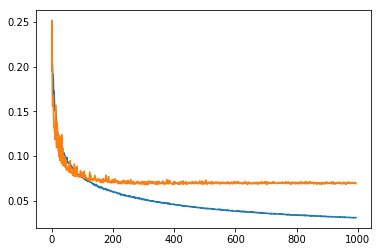

In [19]:
plt.plot(callback_list[1].history['train_loss'][5:])
plt.plot(callback_list[1].history['val_loss'][5:])

In [20]:
checkpoint = torch.load('../results/cnnnet/checkpoint-data-aug.pth-best.tar')

## Loading the best model

In [21]:
from cpe775.utils.img_utils import show_landmarks_batch

In [22]:
best_model = Model(CNNNet((1, 224, 224), (68, 2)))
best_net = model.net
best_net.load_state_dict(checkpoint['state_dict'])

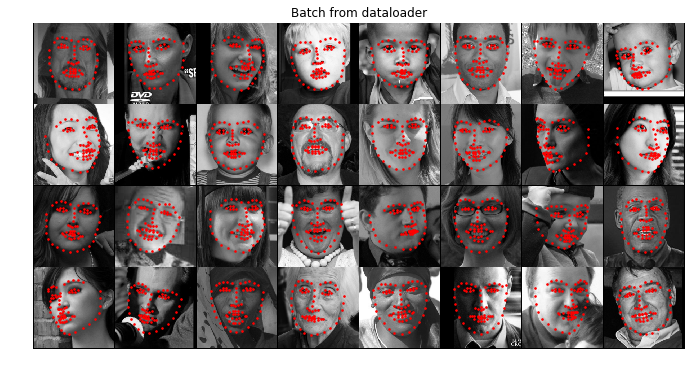

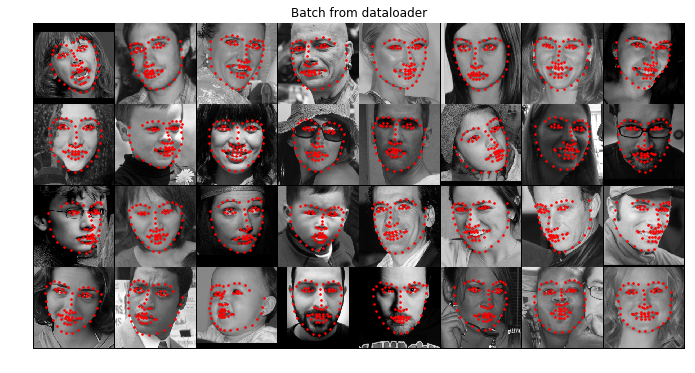

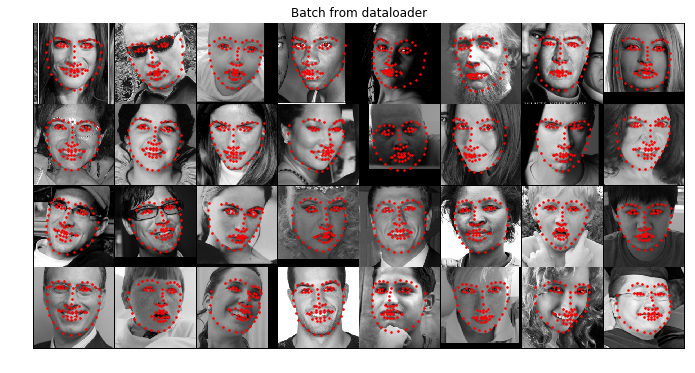

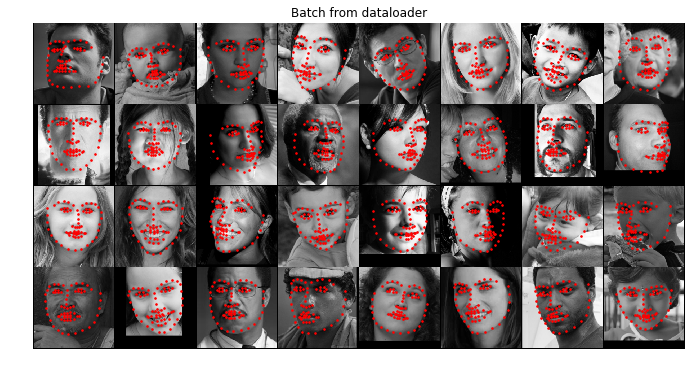

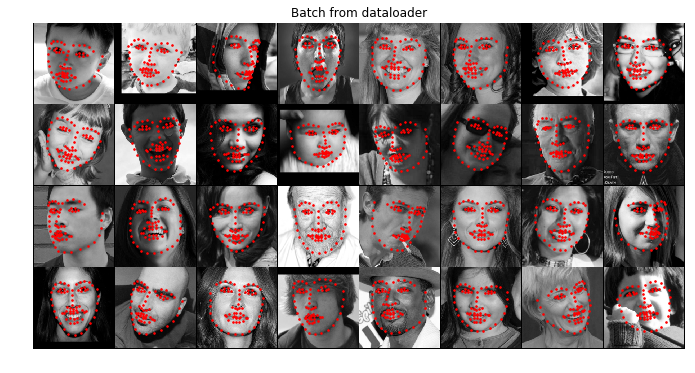

...

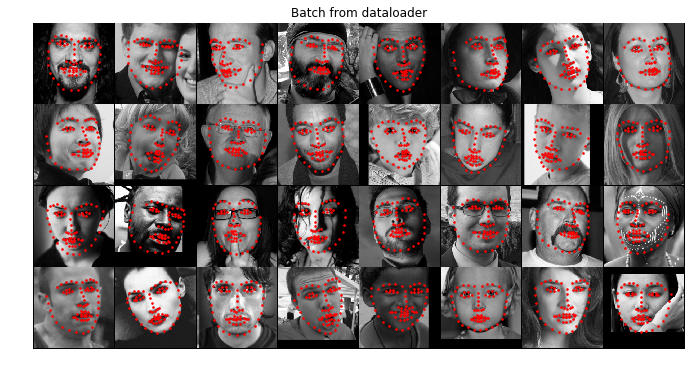

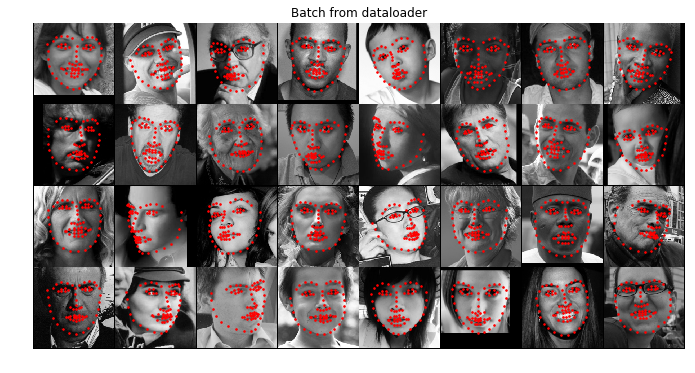

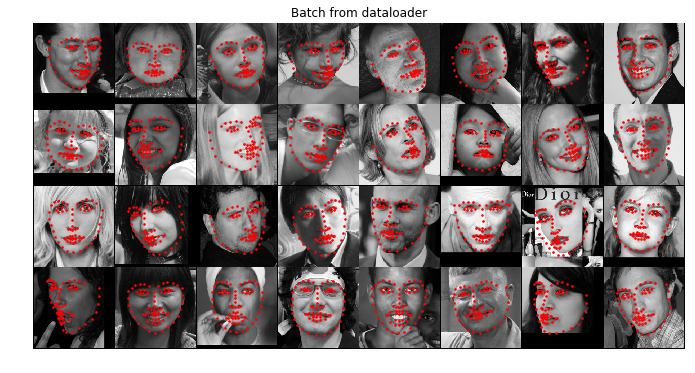

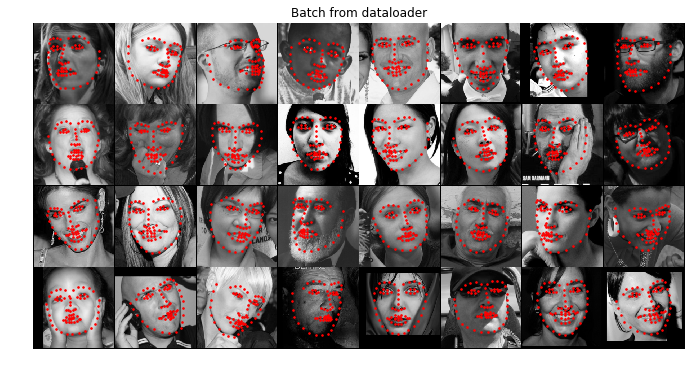

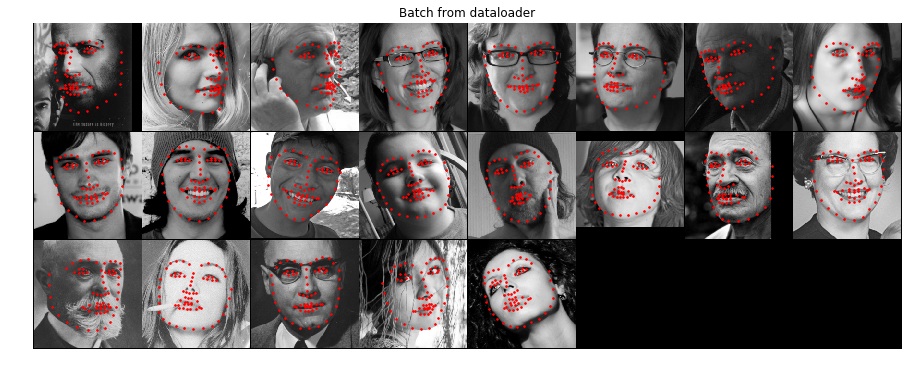

In [23]:
for i_batch, sample_batched in enumerate(valid_loader):
    
    predicted_landmarks = best_net(torch.autograd.Variable(sample_batched['image'], volatile=False)).cpu().data
    plt.figure(figsize=(20,6))
    show_landmarks_batch({'image': sample_batched['image'], 'landmarks': predicted_landmarks})
    plt.axis('off')
    plt.ioff()
    plt.show()

### Common test

In [24]:
transforms = Compose([
                   CropFace(),
                   CenterCrop(224),
                   ToGray(),
                   ToTensor()
                 ])

In [25]:
# load the dataset
dataset = FaceLandmarksDataset(csv_file='../data/common_test.csv',
                               root_dir='../data/',
                               transform=transforms)

common_loader = torch.utils.data.DataLoader(dataset, 
                batch_size=batch_size, num_workers=4)

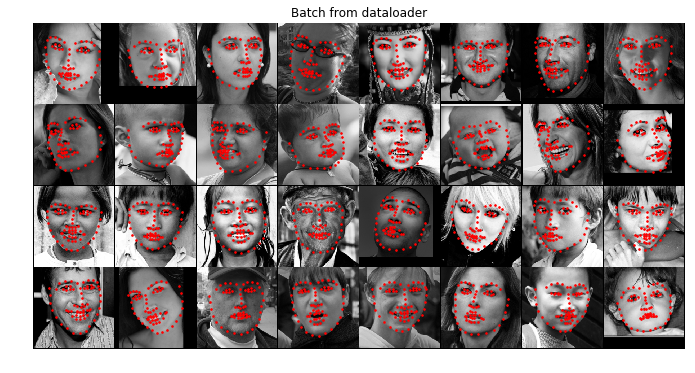

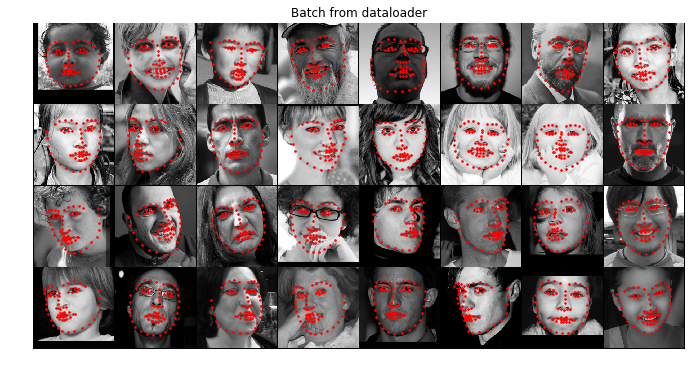

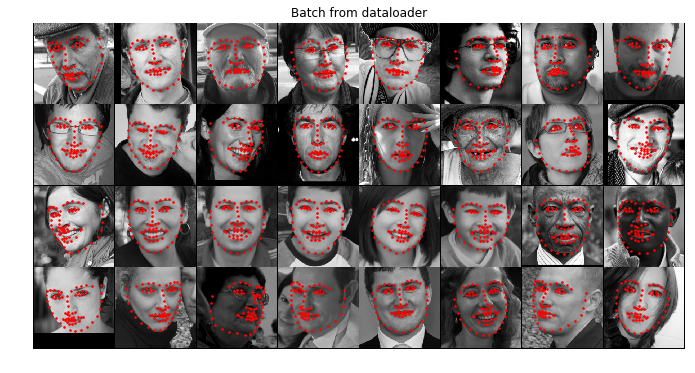

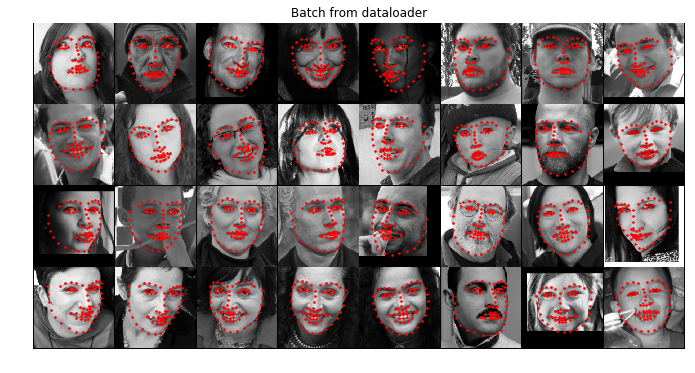

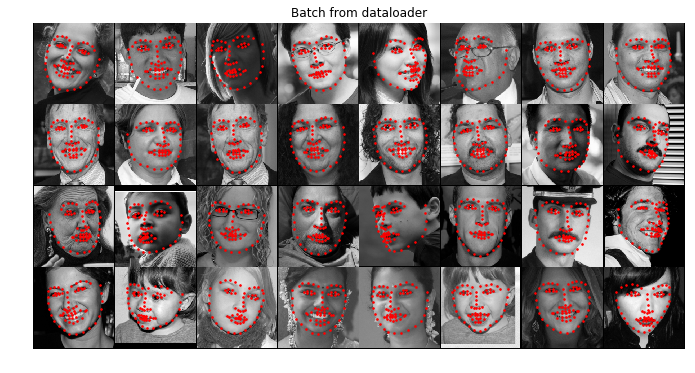

...

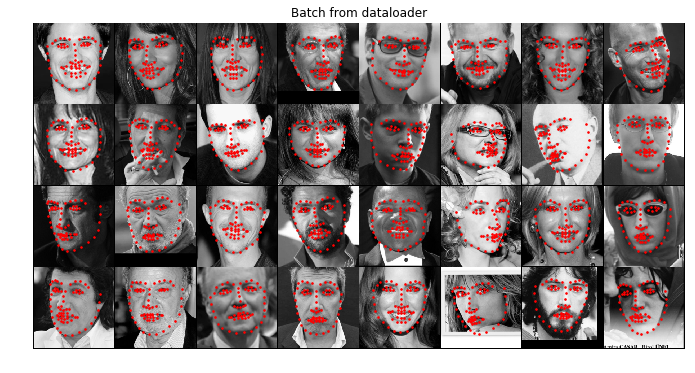

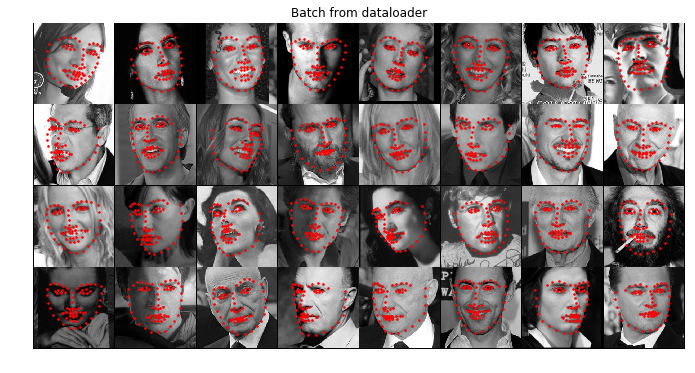

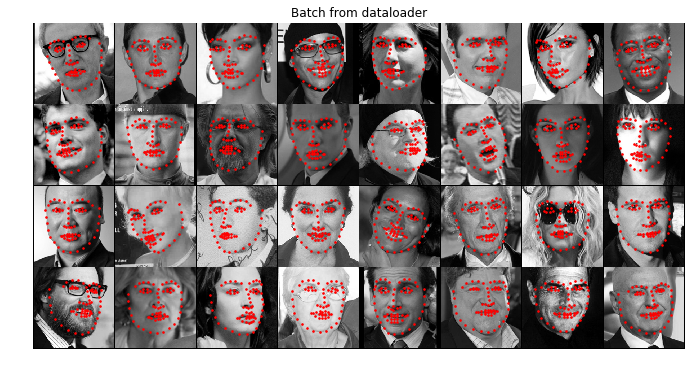

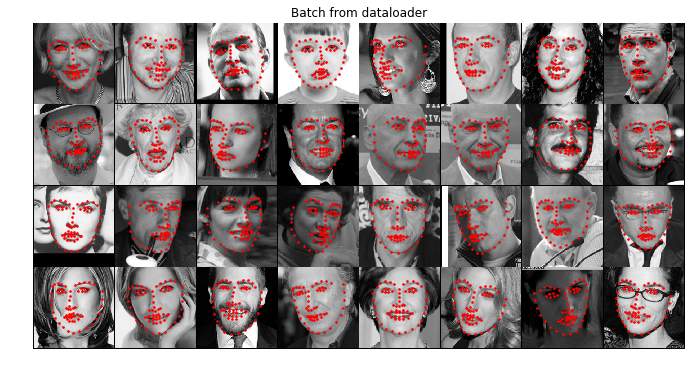

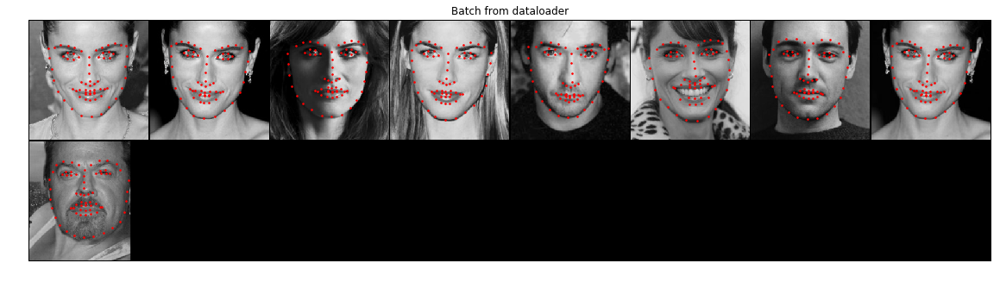

In [26]:
loss = 0
for i_batch, sample_batched in enumerate(common_loader):
    
    predicted_landmarks = best_net(torch.autograd.Variable(sample_batched['image'], volatile=False)).cpu().data
    
    loss += predicted_landmarks.shape[0]*criterion(predicted_landmarks, sample_batched['landmarks'])
    
    plt.figure(figsize=(20,6))
    show_landmarks_batch({'image': sample_batched['image'], 'landmarks': predicted_landmarks})
    plt.axis('off')
    plt.ioff()
    plt.show()

In [27]:
loss/len(dataset)

0.06518626176359749

### Challenging test

In [28]:
# load the dataset
challenging_set = FaceLandmarksDataset(csv_file='../data/challenging_test.csv',
                               root_dir='../data/',
                               transform=transforms)

challeging_loader = torch.utils.data.DataLoader(challenging_set, 
                batch_size=batch_size, num_workers=4)

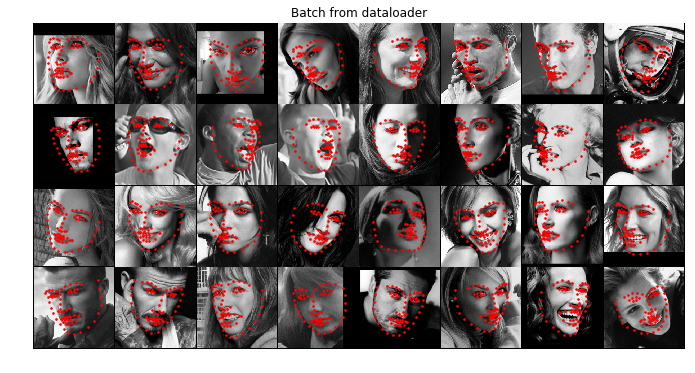

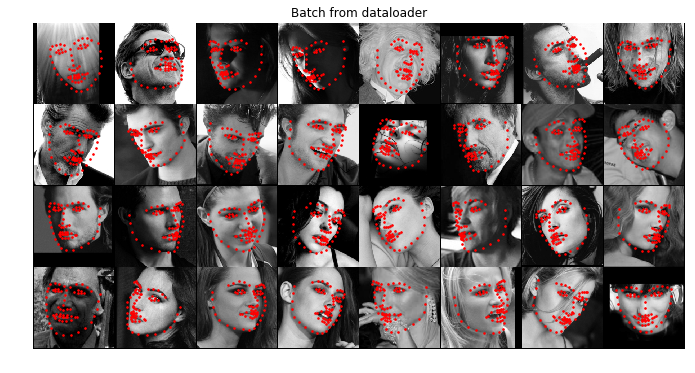

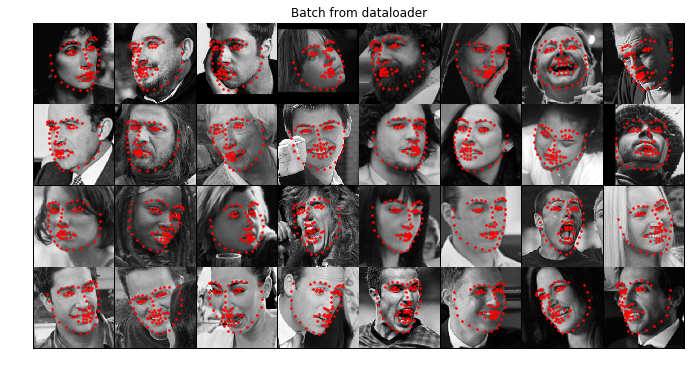

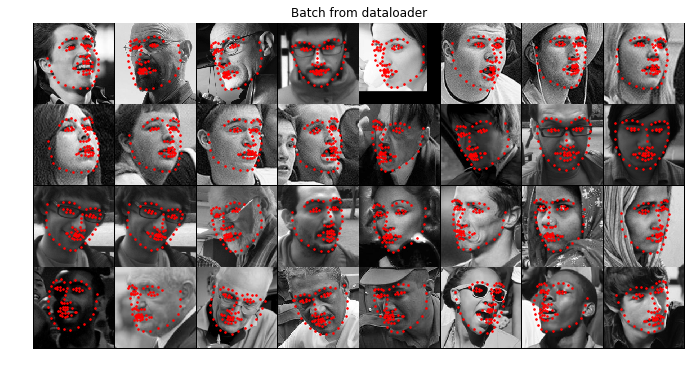

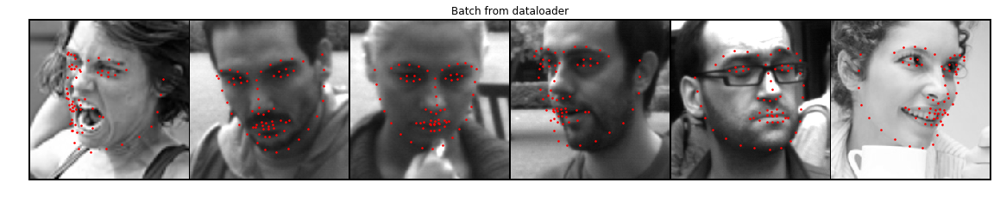

In [29]:
loss = 0
for i_batch, sample_batched in enumerate(challeging_loader):
    
    predicted_landmarks = best_net(torch.autograd.Variable(sample_batched['image'], volatile=False)).cpu().data
    
    loss += predicted_landmarks.shape[0]*criterion(predicted_landmarks, sample_batched['landmarks'])
    
    plt.figure(figsize=(20,6))
    show_landmarks_batch({'image': sample_batched['image'], 'landmarks': predicted_landmarks})
    plt.axis('off')
    plt.ioff()
    plt.show()

In [30]:
loss/len(challenging_set)

0.13849346031115126